## тут есть обрезание прыжков мыши, показана проблема с 4 мышью

есть функция, измененяющая координаты мыши так, чтобы первая точка была в 0

графики тайм серий x и y

автокорелляция x у всех мышей апрель

автокорелляция фильтрованной скорости и рандома

показано, что мышь 9.2 засела на 1 месте

построены карты оккупации нормализация логарифм, минмах - для всех мышь и усредненная

аналогично построены карты дивергенции для каждой мыши и средняя


In [29]:
import traja
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import seaborn as sns
from scipy import signal
#''' Statsmodels '''

import statsmodels.api as sm

In [2]:
def openFile(ff):
    df = pd.read_csv(ff, sep=" ",header = None, names=['numb', 'time', 'x', 'y'])
    df = df.drop('numb', axis=1)
    df = df.drop(df[df.time > 1755].index)
    df.traja.plot()
    return(df)

def cutjump(df, xmax, xmin, ymax, ymin):
    dff = df[(df['x'] < xmax) & (df['x'] > xmin) & (df['y'] < ymax) & (df['y'] > ymin)]
    ind = range(0, len(dff))
    dff = dff.reindex(ind)
    dff.traja.plot()
    return dff

In [51]:
def minmax(occ):
    if isinstance(occ, pd.DataFrame):
        occ = occ.to_numpy()
    #print(np.amin(occ))
    #print(np.amax(occ))
    kk = (occ - np.amin(occ)) / (np.amax(occ) - np.amin(occ))
    kl = pd.DataFrame(kk)
    #print(kl)
    sns.heatmap(kl, square=True, xticklabels=False, yticklabels=False)
    plt.show()
    return kl

In [52]:
def occupMapNorm(df):
    xmin = df["x"].min() - 0.1
    xmax = df["x"].max() + 0.1
    binx = np.linspace(xmin, xmax, 16)
    x_cut = pd.cut(df.x, binx, right=False)
    #делаем df где будет понятно сколько было точек в каждом бине 
    #соответсвуеющему данному интервалу х и данному интервалу у
    ymin = df["y"].min() - 0.1
    ymax = df["y"].max() + 0.1
    biny = np.linspace(ymin, ymax, 16)
    y_cut = pd.cut(df.y, biny, right=False)
    dfn = df.groupby([x_cut, y_cut]).count()
    
    print(x_cut.isnull().values.any(), y_cut.isnull().values.any())
    
    dfn = dfn.drop(columns=['x','y'])
    dfn = dfn.rename(columns={'time': 'Count'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    dd = dd.replace(0, 1.e-1)
    arrd = dd.to_numpy()
    arrl = np.log(arrd)
    arrsrsr = np.sqrt(np.sqrt(np.sqrt(arrd)))
    #sns.heatmap(arrl, square=True)
    arrl = minmax(arrl)
    #sns.heatmap(arrl, square=True, xticklabels=False, yticklabels=False)
    #plt.show()
    return(arrl)
    

### Загрузка траекторий

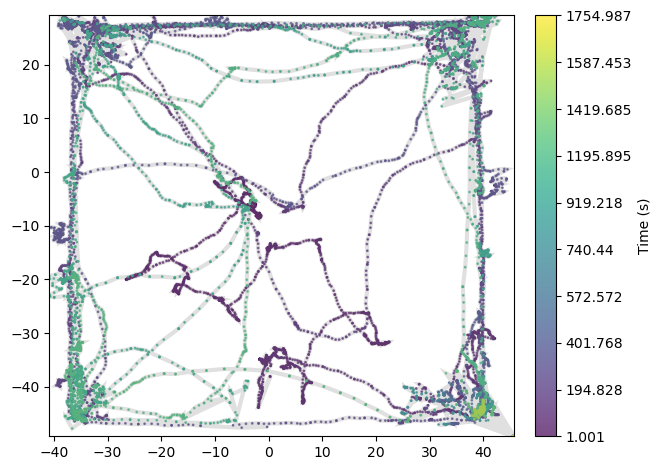

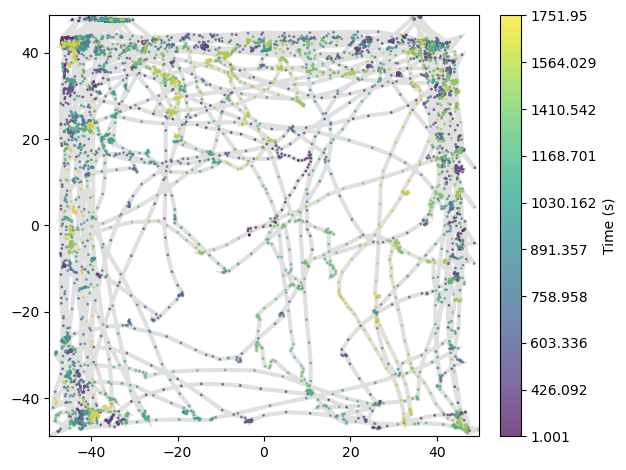

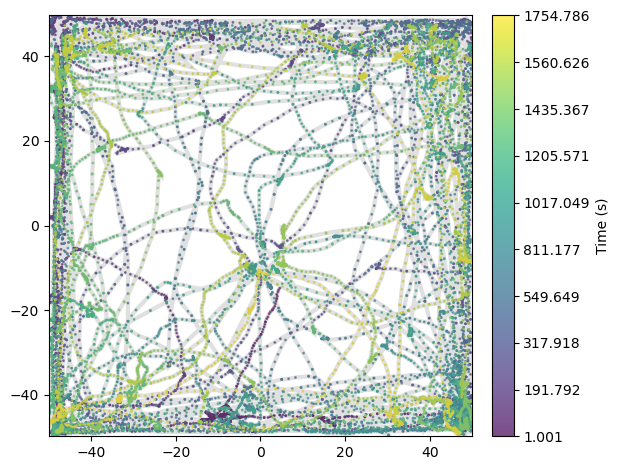

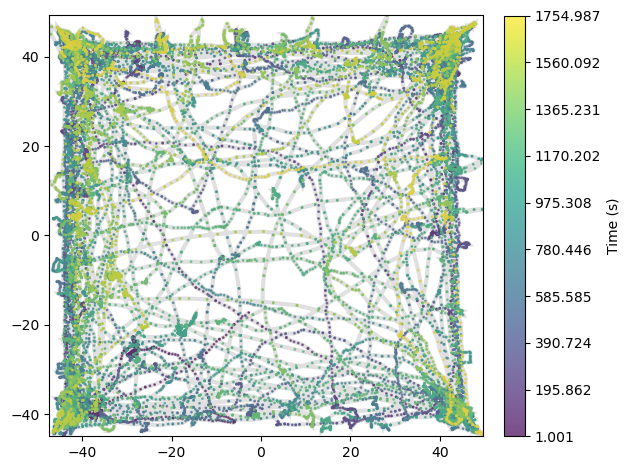

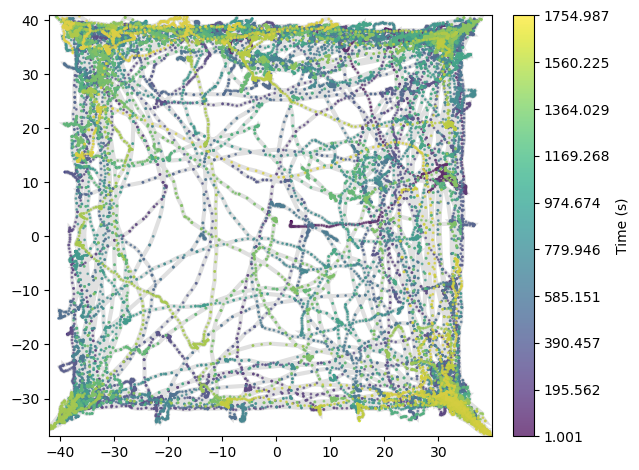

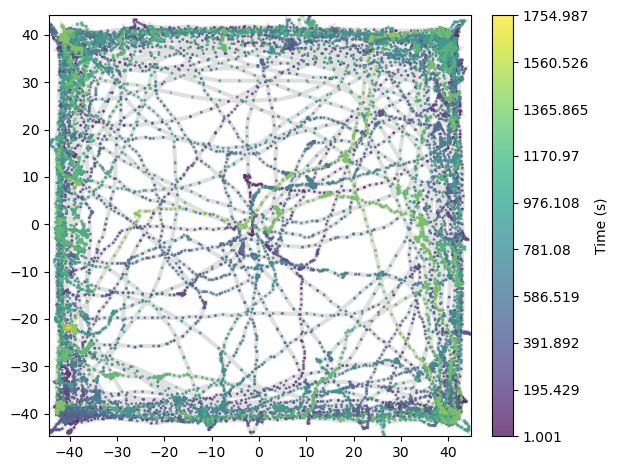

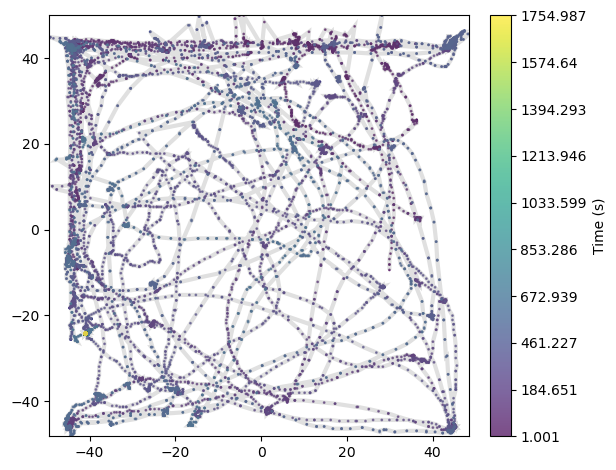

In [6]:
tr4 = openFile('Trace_4.txt')
tr3 = openFile('Trace_3.txt')
tr5 = openFile('Trace_5.txt')
tr6 = openFile('Trace_6.txt')
tr7 = openFile('Trace_7.txt')
tr91 = openFile('Trace_9.1.txt')
tr92 = openFile('Trace_9.2.txt')

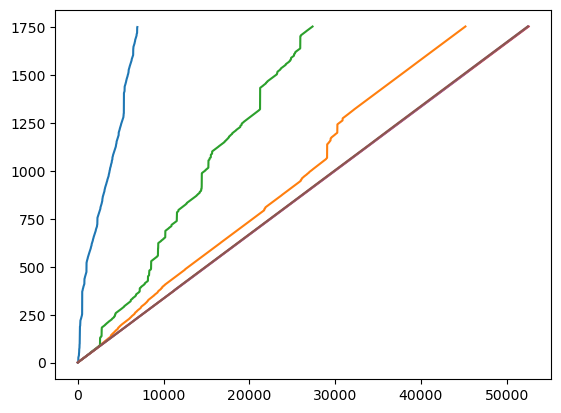

In [8]:
#до вырезанных прыжков
plt.plot(tr3['time'])
plt.plot(tr4['time'])
plt.plot(tr5['time'])
plt.plot(tr6['time'])
plt.plot(tr7['time'])
plt.plot(tr91['time'])

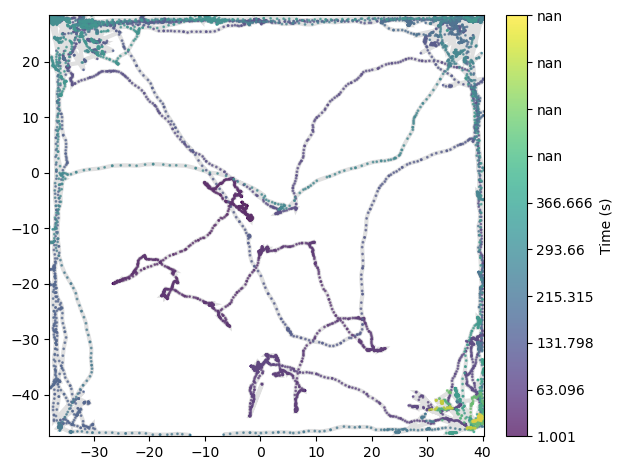

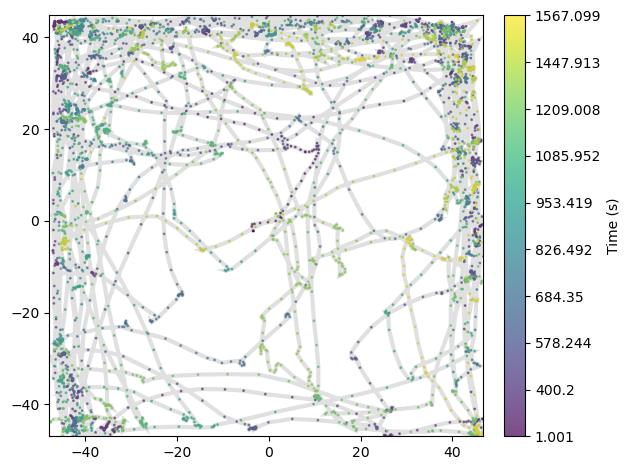

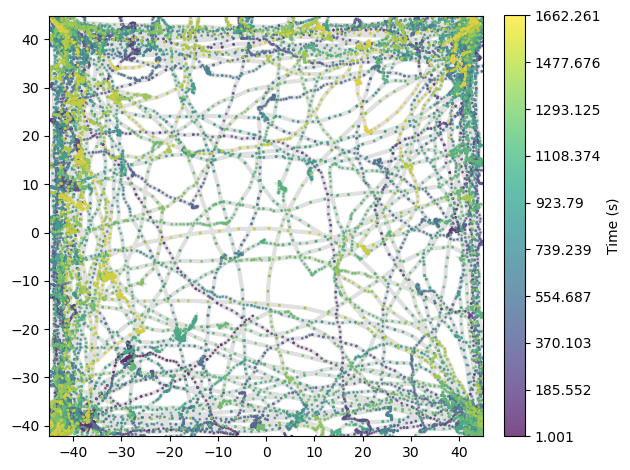

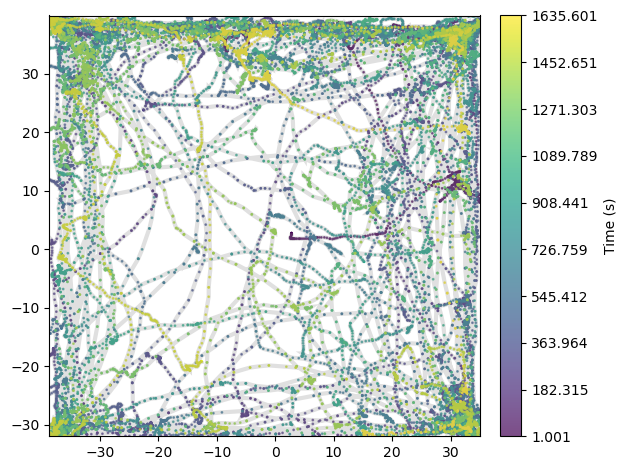

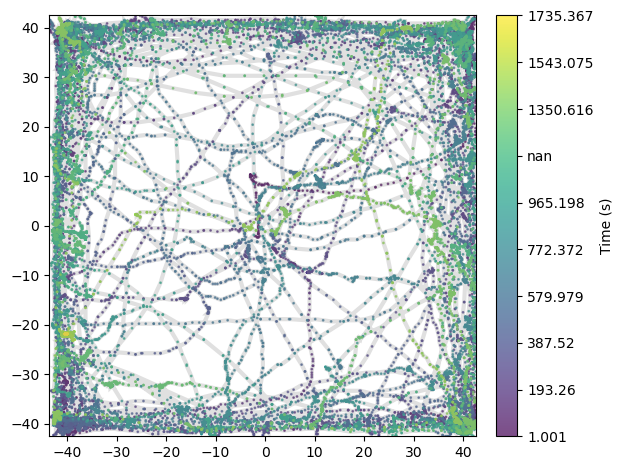

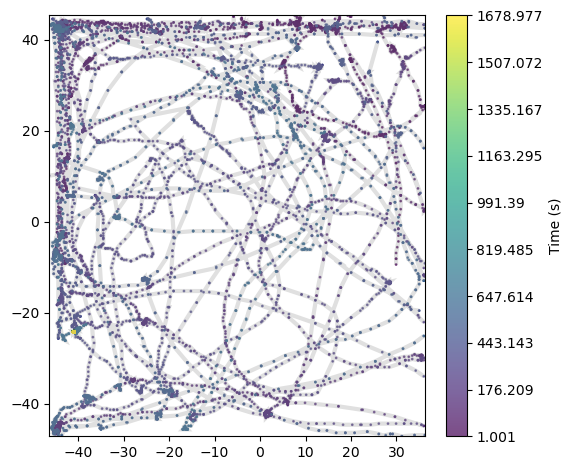

In [9]:
tr4 = cutjump(tr4, xmax=40.4, xmin=-38.1, ymax=28.3, ymin=-47.6)
tr3 = cutjump(tr3, xmax=46.8, xmin=-48, ymax=46, ymin=-47)
tr6 = cutjump(tr6, xmax=45, xmin=-45, ymax=45, ymin=-42.2)
tr7 = cutjump(tr7, xmax=35, xmin=-38.7, ymax=40, ymin=-32)
tr91 = cutjump(tr91, xmax=42.5, xmin=-43.7, ymax=42.5, ymin=-42.7)
tr92 = cutjump(tr92, xmax=36.3, xmin=-46.5, ymax=45.4, ymin=-47.3)

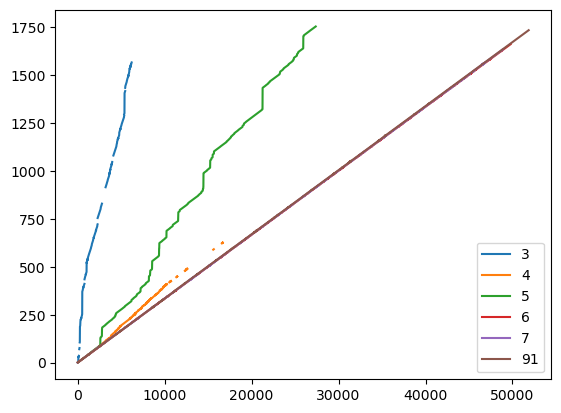

In [10]:
#после вырезания прыжков
plt.plot(tr3['time'], label='3')
plt.plot(tr4['time'], label='4')
plt.plot(tr5['time'], label='5')
plt.plot(tr6['time'], label='6')
plt.plot(tr7['time'], label='7')
plt.plot(tr91['time'], label='91')
plt.legend()

#### Пусть первая точка будет (0, 0)

In [11]:
def X0Y0(tr):
    tr['x'] = tr['x'] - tr['x'][0]
    tr['y'] = tr['y'] - tr['y'][0]
    return(tr)
    

In [13]:
alltr = [tr4, tr3, tr5, tr6, tr7, tr91]

In [14]:
for i in alltr:
    i = X0Y0(i)

In [17]:
for i in alltr:
    print(i['x'].max(), i['x'].min(), i['y'].max(), i['y'].min())

43.686 -34.715 33.621 -42.154
50.192 -44.51 46.971999999999994 -44.794000000000004
45.334999999999994 -54.491 64.384 -34.998000000000005
47.68 -42.181999999999995 62.18299999999999 -24.930000000000003
32.163 -41.424 37.195 -34.714999999999996
44.561 -41.575 44.561 -40.427


In [18]:
for i in alltr:
    print(i['x'].max() - i['x'].min(), i['y'].max() - i['y'].min())

78.40100000000001 75.775
94.702 91.76599999999999
99.826 99.382
89.862 87.113
73.58699999999999 71.91
86.136 84.988


### Графики тайм серий x и y

In [13]:
%matplotlib inline

Text(0.5, 1.0, 'Y Function')

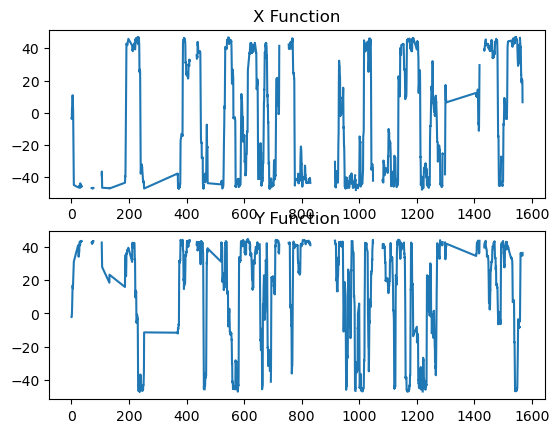

In [120]:
figure, axis = plt.subplots(2, 1)
axis[0].plot(tr3['time'], tr3['x'])
axis[0].set_title("X Function")
  
# For Cosine Function
axis[1].plot(tr3['time'], tr3['y'])
axis[1].set_title("Y Function")

##### Автокорелляция не вышло

values = pd.DataFrame(tr3['x'])
values

#using shift function to shift the values.
dataframe = pd.concat([values.shift(367), values.shift(97),
                       values.shift(1), values], axis=1)
#naming the columns
dataframe.columns = ['t-370', 't+100', 't+2', 't+3']
dataframe

#using corr() function to compute the correlation
result = dataframe.corr()
 
print(result)

#import the required modules
import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf
 
#read the csv data
data = tr3['x']
#plot the auto correlation
plot_acf(data)

##### Нормальный график автокорреляции на примере мыши 3

#Our data set 
tr3 = openFile('Trace_3.txt') #открывем заново, т к удобнее взять дф без вырезанных прыжков
datax = tr3['x']
print(len(datax))


#Delay (lag) range that we are interesting in
lags = range(6197)
#''' Statsmodels '''

import statsmodels.api as sm

acorrx = sm.tsa.acf(datax, nlags = len(lags)-1, fft=False)

acorrx

plt.plot(acorrx)
plt.show()


from scipy.fft import fft, fftfreq

#Number of samples in normalized_tone
Nn = len(acorrx)

yf = fft(acorrx)
xf = fftfreq(Nn, 1 / 4)

plt.plot(xf, np.abs(yf))
plt.show()

#Our data set 
datay = tr3['y']
print(len(datay))
#Delay (lag) range that we are interesting in
lags = range(len(datay))
#''' Statsmodels '''

import statsmodels.api as sm

acorry = sm.tsa.acf(datay, nlags = len(lags)-1, fft=False)

acorry

plt.plot(acorry)
plt.show()


from scipy.fft import fft, fftfreq

#Number of samples in normalized_tone
Nn = len(acorry)

yf = fft(acorry)
xf = fftfreq(Nn, 1 / 40)

plt.plot(xf, np.abs(yf))
plt.show()

## автокорелляция х у всех мышей апрель

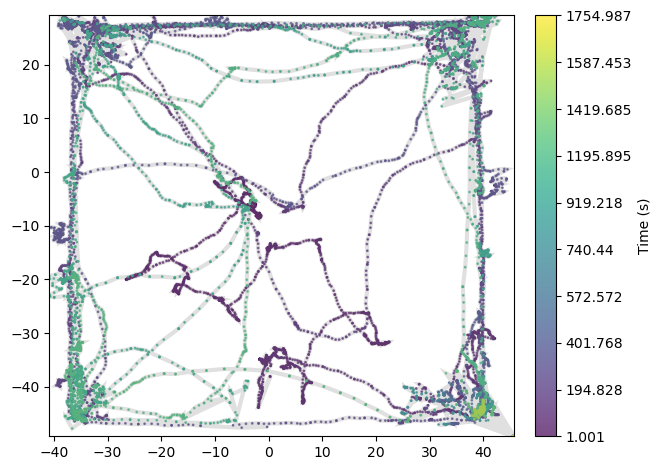

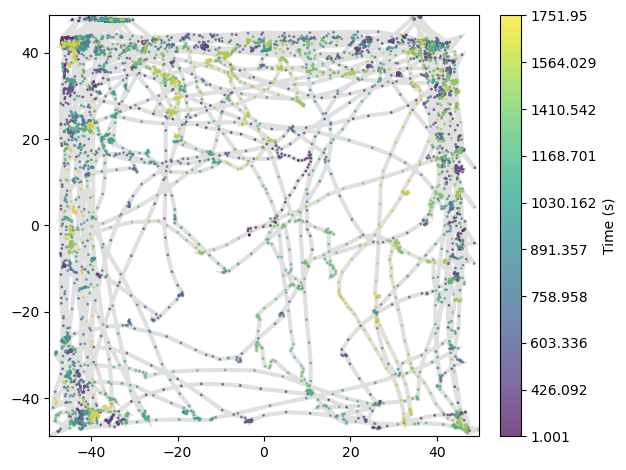

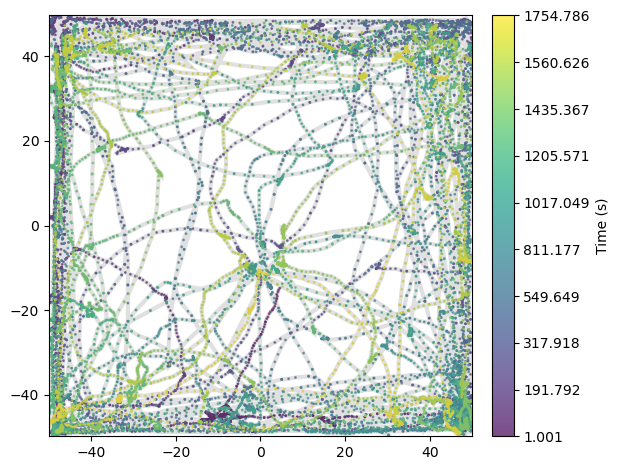

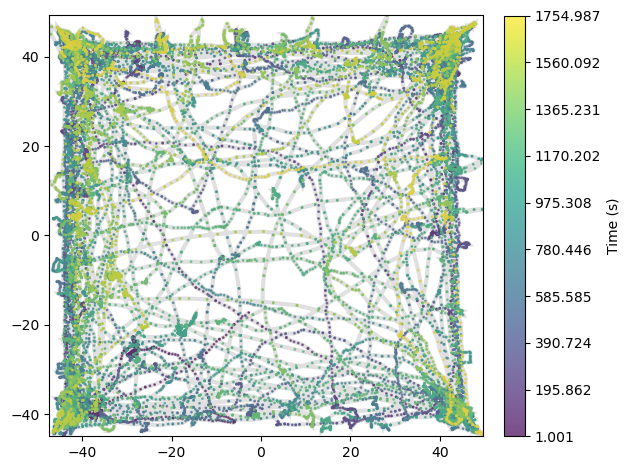

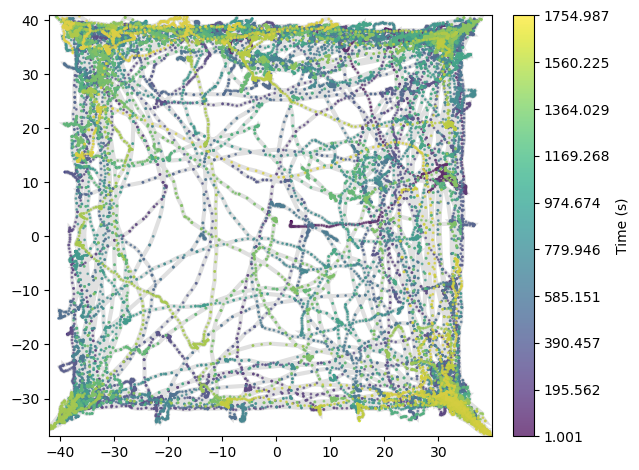

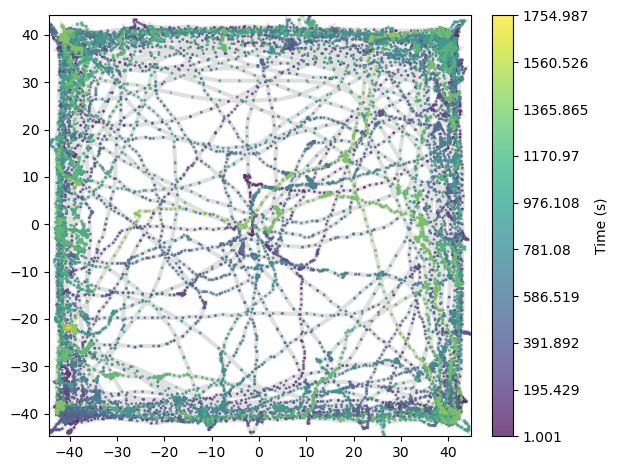

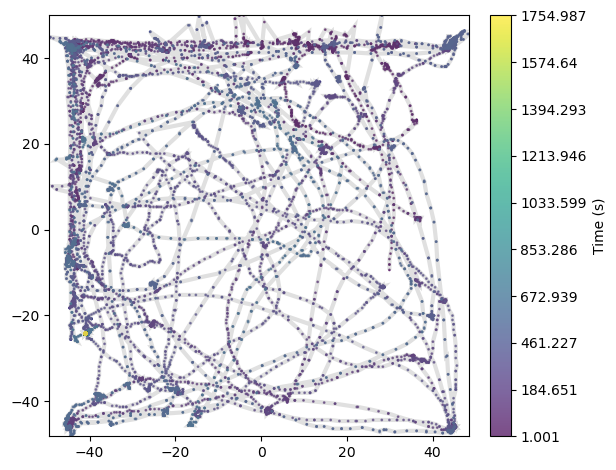

In [27]:
#открывем заново, т к удобнее взять дф без вырезанных прыжков 
tr4 = openFile('Trace_4.txt')
tr3 = openFile('Trace_3.txt')
tr5 = openFile('Trace_5.txt')
tr6 = openFile('Trace_6.txt')
tr7 = openFile('Trace_7.txt')
tr91 = openFile('Trace_9.1.txt')
tr92 = openFile('Trace_9.2.txt')

In [28]:
dfs = [tr4, tr3, tr5, tr6, tr7, tr91, tr92]
names = ['tr4','tr3','tr5','tr6','tr7', 'tr91','tr92']

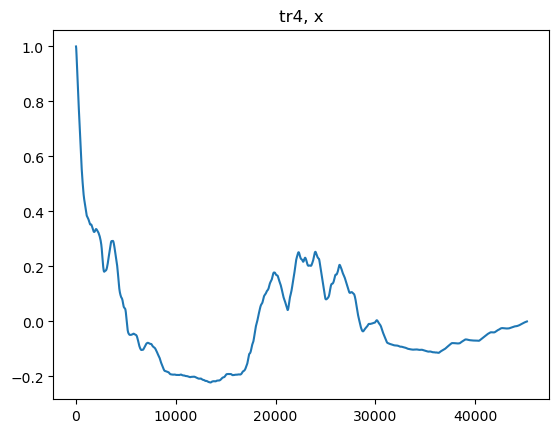

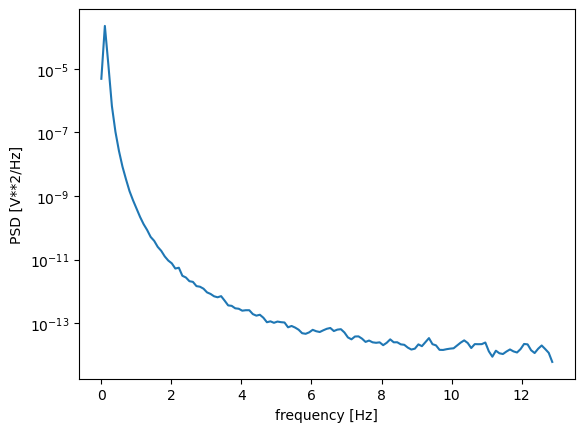

45189


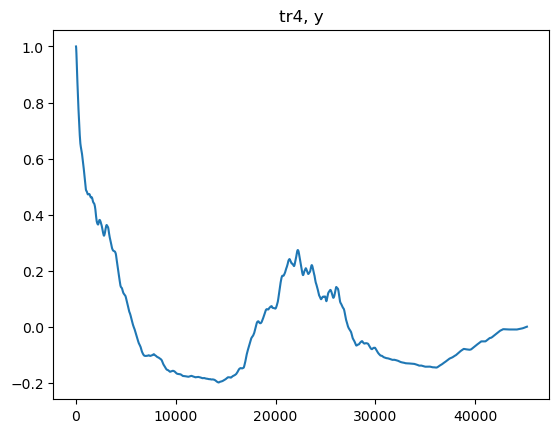

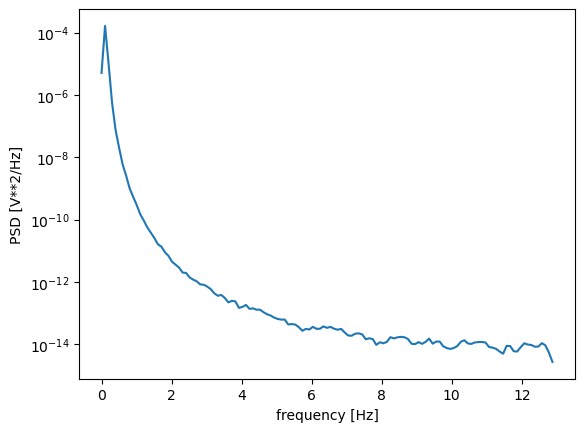

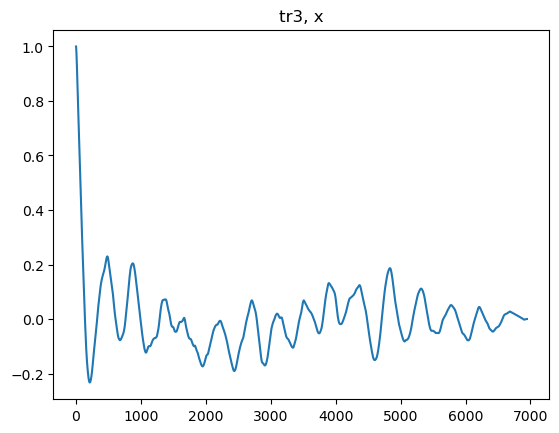

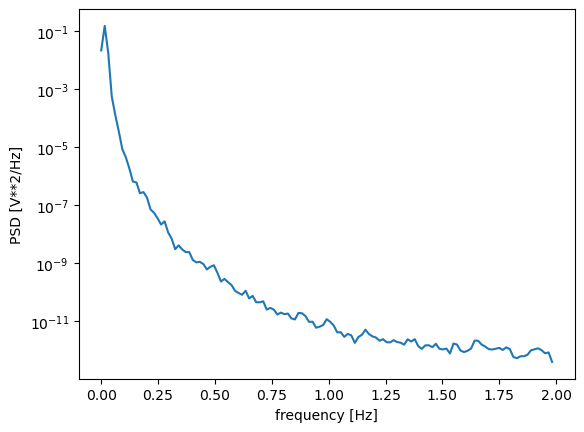

6946


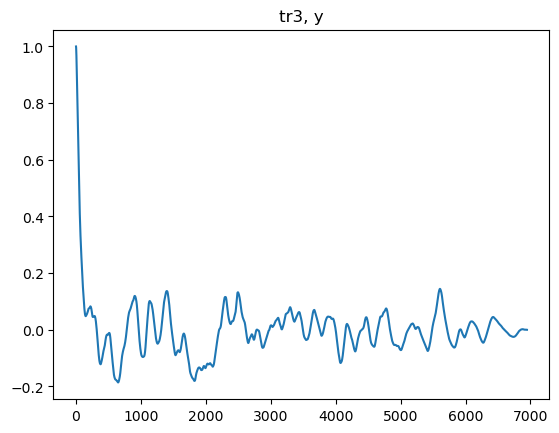

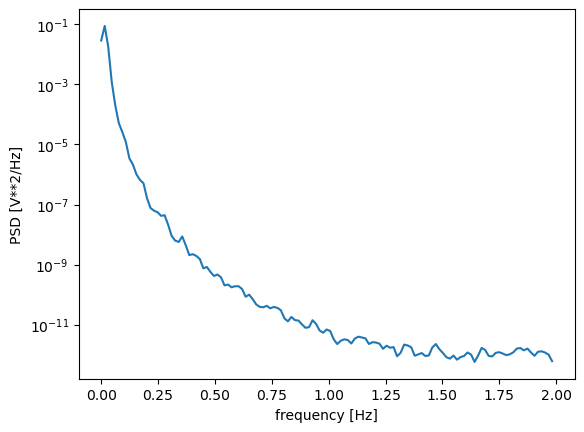

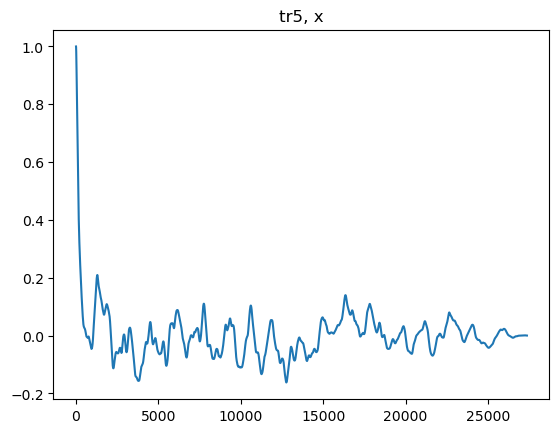

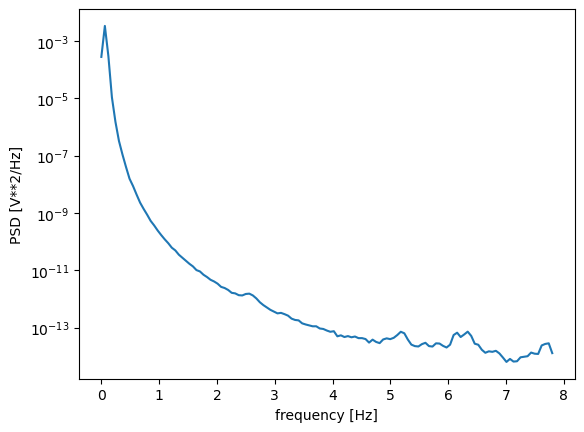

27369


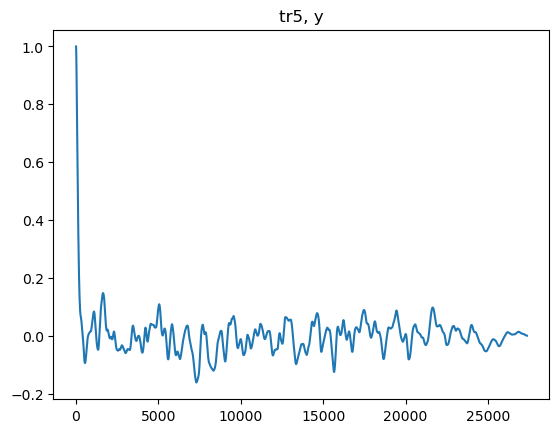

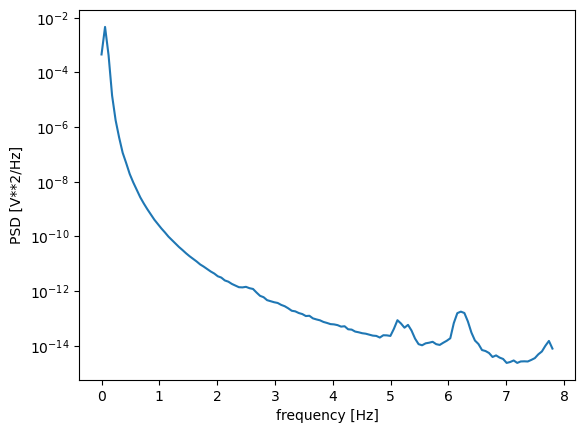

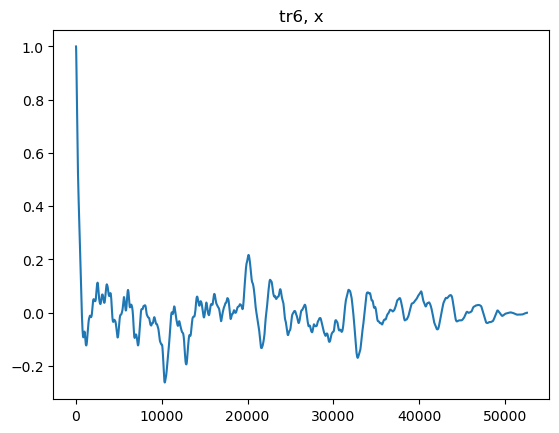

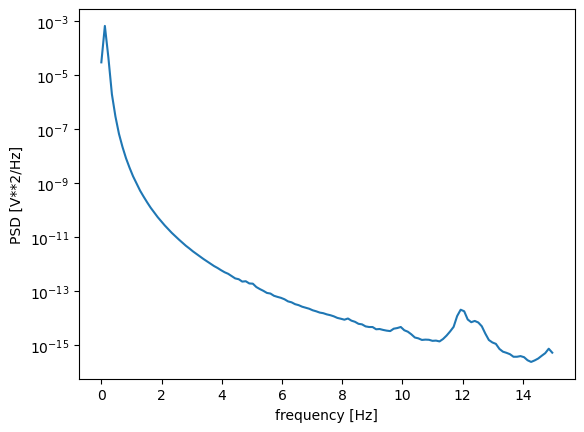

52562


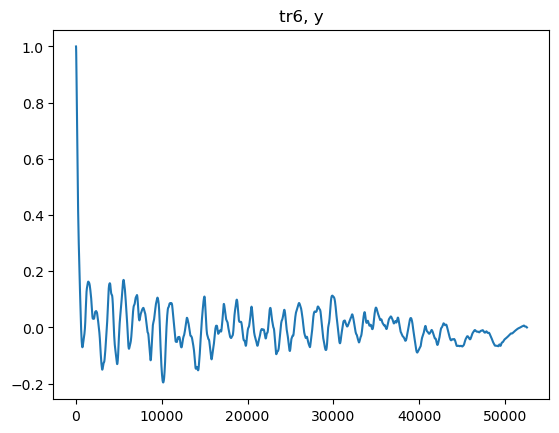

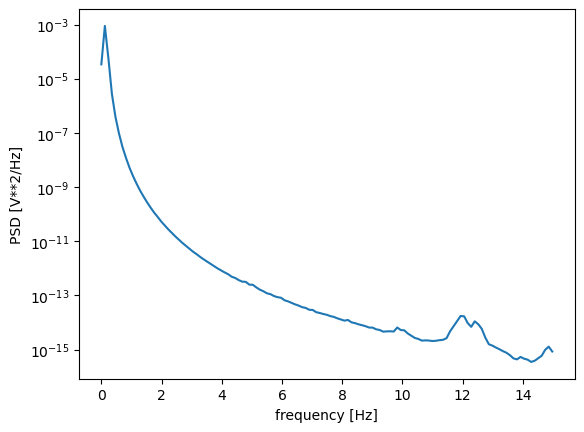

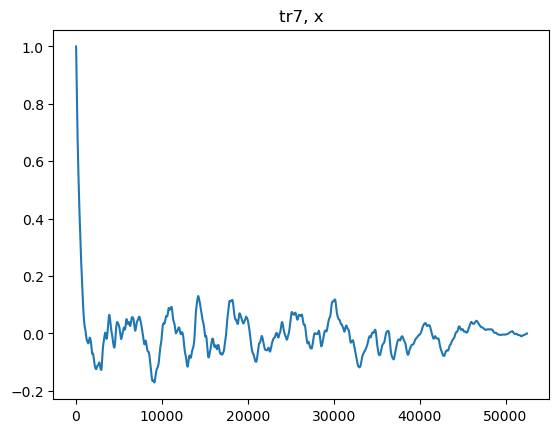

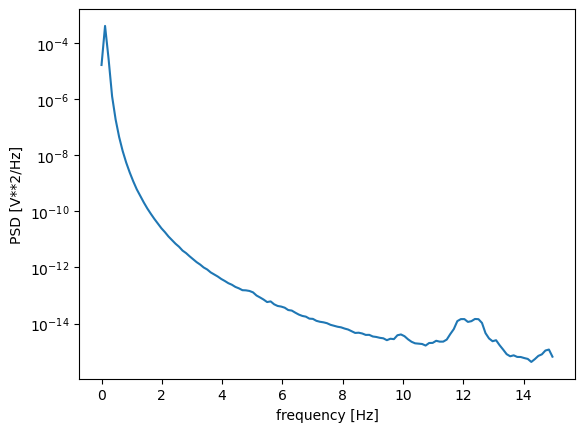

52485


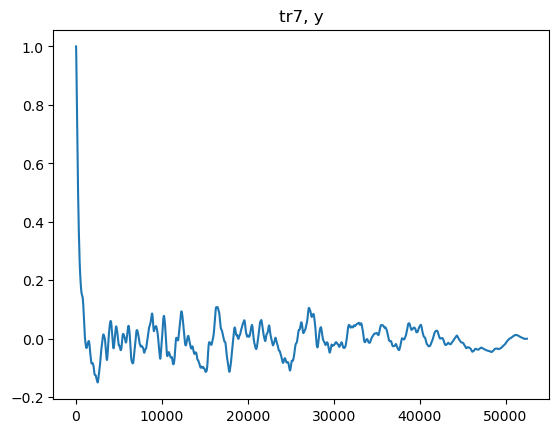

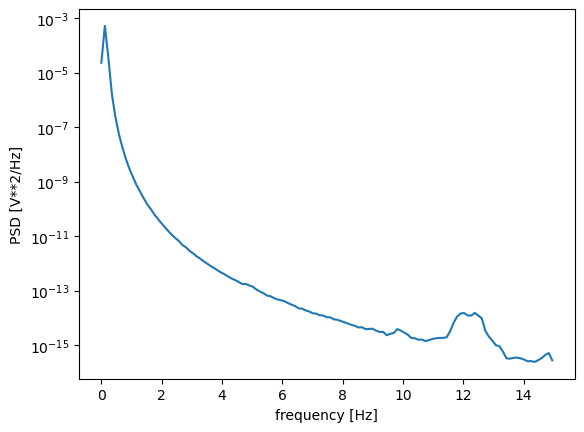

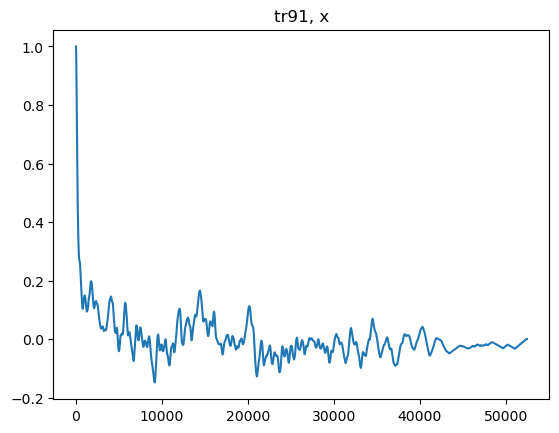

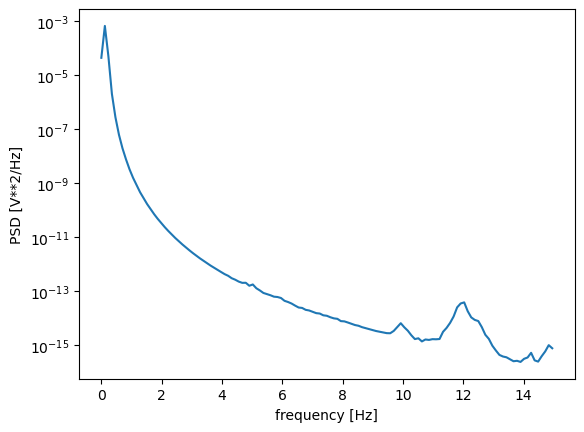

52450


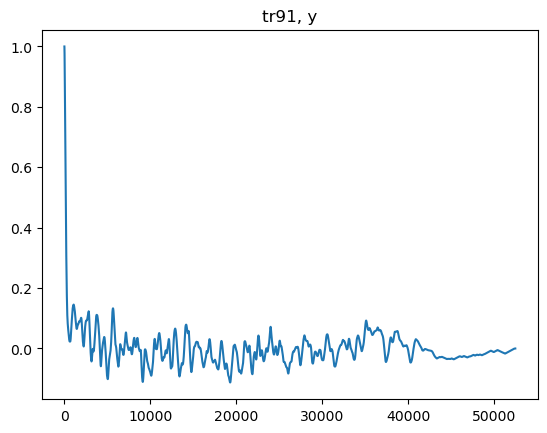

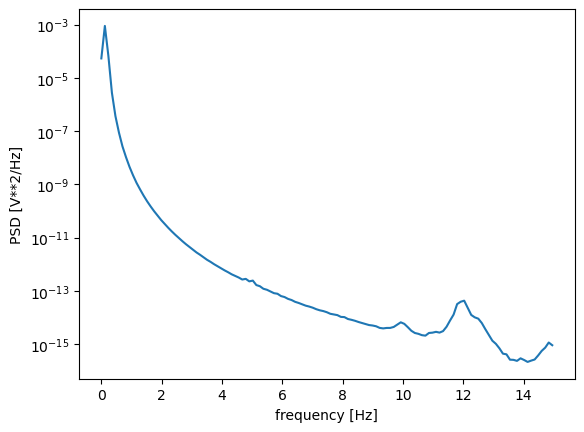

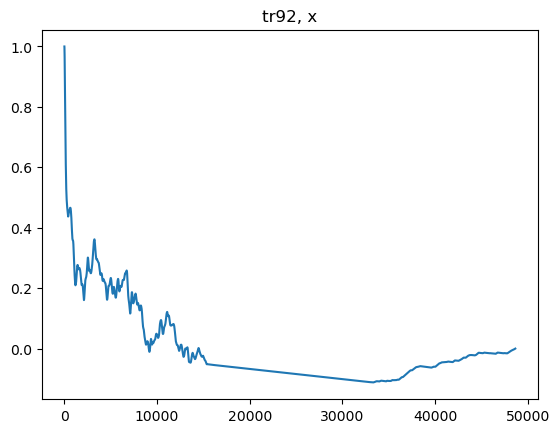

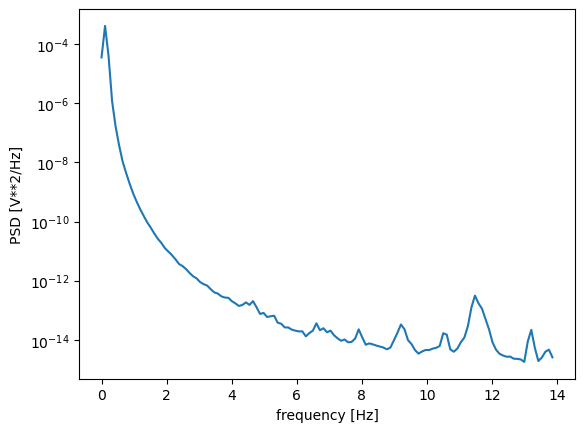

48644


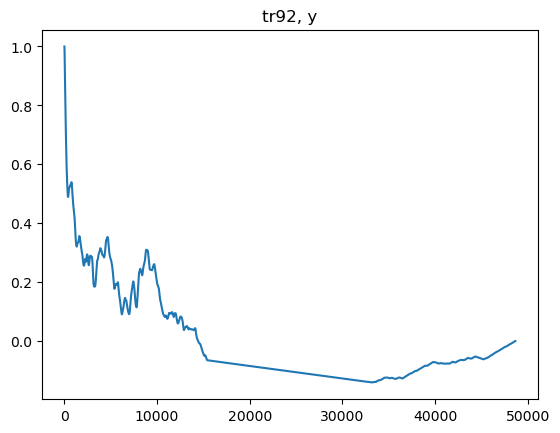

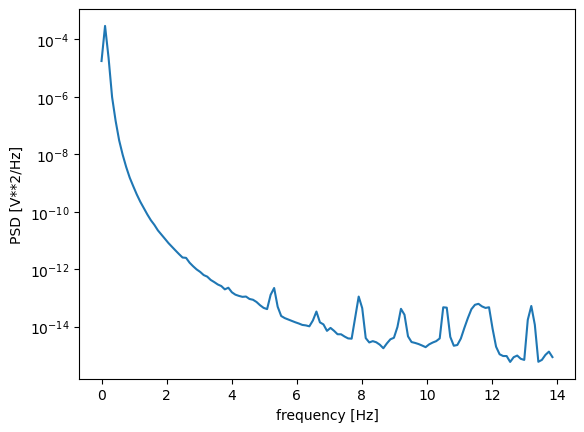

In [31]:
j = 0
for i in dfs:
    #x
    datax = i['x']
    lags = range(len(i))
    acorrx = sm.tsa.acf(datax, nlags = len(lags)-1, fft=False)
    #acorrx
    plt.figure()
    plt.title(names[j] + ', x')
    plt.plot(acorrx)
    plt.show()
    #Nn = len(acorrx)
    #yff = fft(acorrx)
    #xff = fftfreq(Nn, 1 / 40)
    #plt.plot(xff, np.abs(yff))
    #plt.show()
    #psd
    plt.figure()
    fs = len(i) / i['time'].max()
    f, Pxx_den = signal.welch(acorrx, fs)
    plt.semilogy(f, Pxx_den)
    #plt.ylim([0.5e-3, 1])
    plt.xlabel('frequency [Hz]')
    plt.ylabel('PSD [V**2/Hz]')
    plt.show()
    
    #y
    plt.figure()
    datay = i['y']
    print(len(datay))
    # Delay (lag) range that we are interesting in
    lags = range(len(datay))
    acorry = sm.tsa.acf(datay, nlags = len(lags)-1, fft=False)
    acorry
    plt.title(names[j] + ', y')
    plt.plot(acorry)
    j+=1
    plt.show()
    #psd
    plt.figure()
    f, Pxx_den = signal.welch(acorry, fs)
    plt.semilogy(f, Pxx_den)
    #plt.ylim([0.5e-3, 1])
    plt.xlabel('frequency [Hz]')
    plt.ylabel('PSD [V**2/Hz]')
    plt.show()


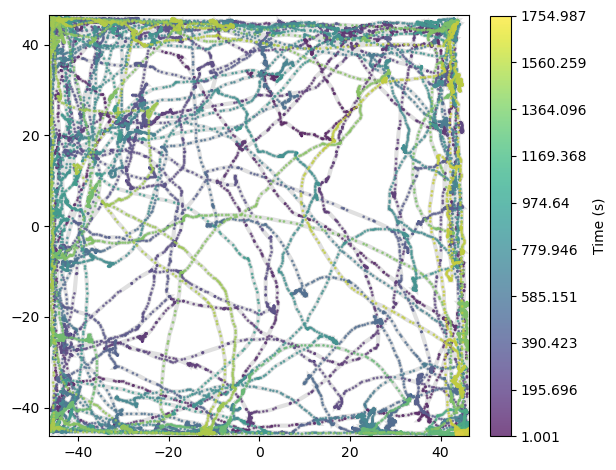

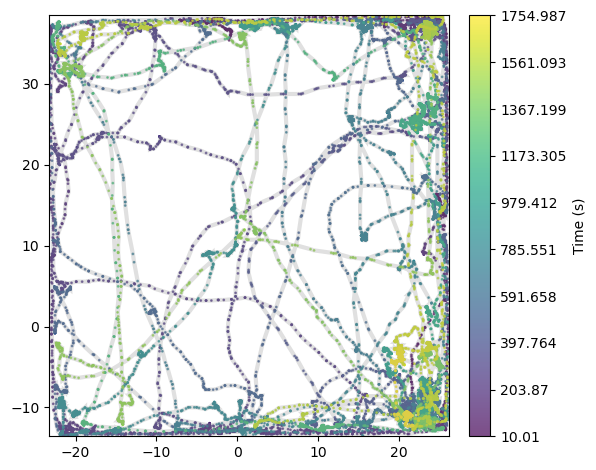

In [32]:
tr1, tr2 = openFile('Trace_1.1.txt'), openFile('Trace_2.txt')

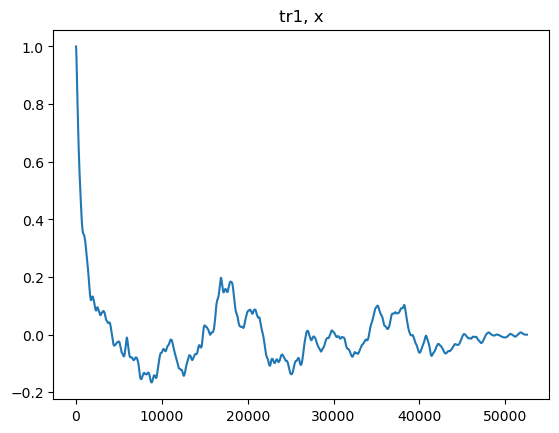

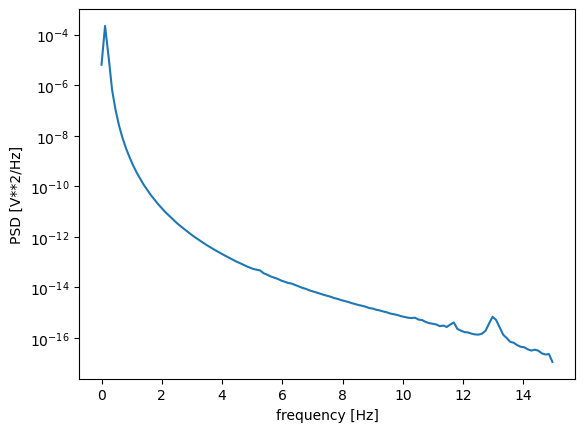

52523


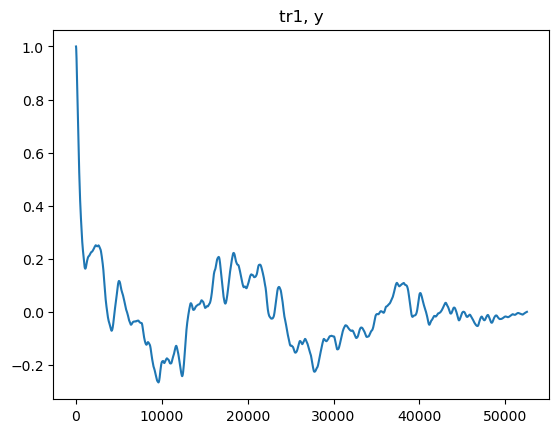

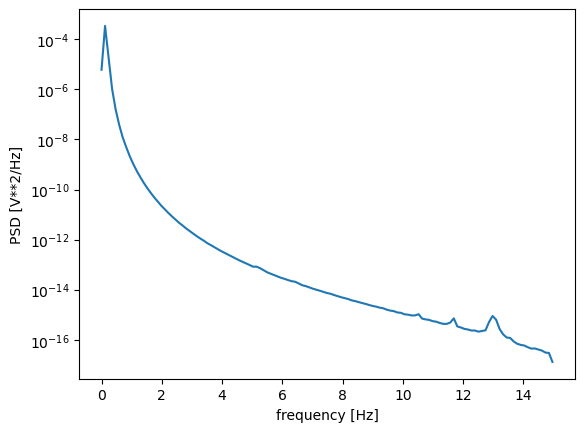

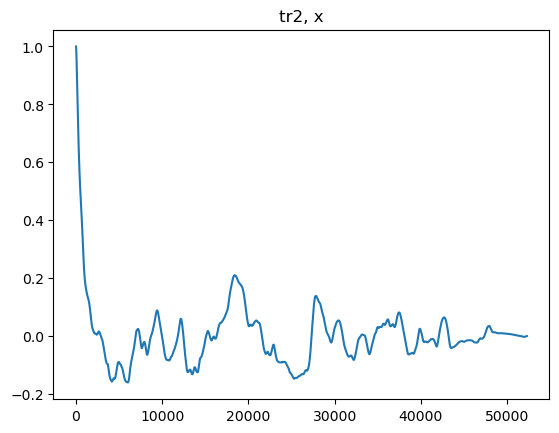

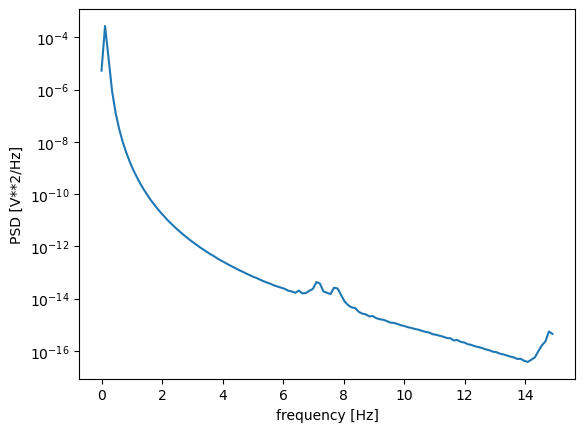

52298


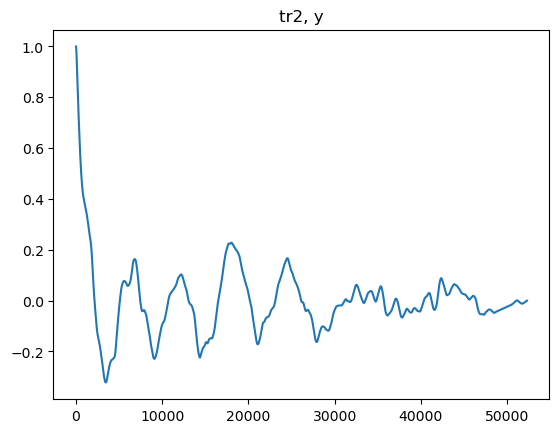

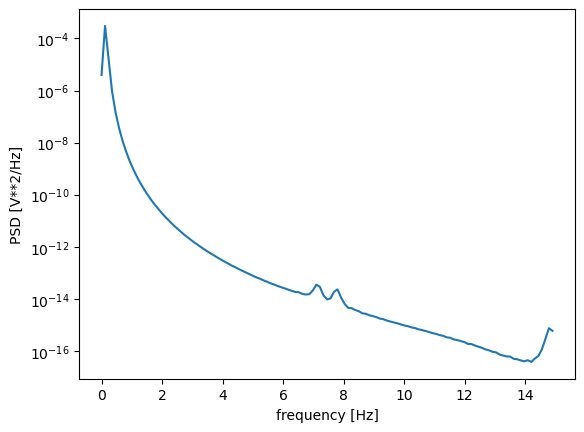

In [33]:
j = 0
nna = ['tr1', 'tr2']
for i in [tr1, tr2]:
    #x
    datax = i['x']
    lags = range(len(i))
    acorrx = sm.tsa.acf(datax, nlags = len(lags)-1, fft=False)
    #acorrx
    plt.figure()
    plt.title(nna[j] + ', x')
    plt.plot(acorrx)
    plt.show()
    #Nn = len(acorrx)
    #yff = fft(acorrx)
    #xff = fftfreq(Nn, 1 / 40)
    #plt.plot(xff, np.abs(yff))
    #plt.show()
    #psd
    plt.figure()
    fs = len(i) / i['time'].max()
    f, Pxx_den = signal.welch(acorrx, fs)
    plt.semilogy(f, Pxx_den)
    #plt.ylim([0.5e-3, 1])
    plt.xlabel('frequency [Hz]')
    plt.ylabel('PSD [V**2/Hz]')
    plt.show()
    
    #y
    plt.figure()
    datay = i['y']
    print(len(datay))
    # Delay (lag) range that we are interesting in
    lags = range(len(datay))
    acorry = sm.tsa.acf(datay, nlags = len(lags)-1, fft=False)
    acorry
    plt.title(nna[j] + ', y')
    plt.plot(acorry)
    j+=1
    plt.show()
    #psd
    plt.figure()
    f, Pxx_den = signal.welch(acorry, fs)
    plt.semilogy(f, Pxx_den)
    #plt.ylim([0.5e-3, 1])
    plt.xlabel('frequency [Hz]')
    plt.ylabel('PSD [V**2/Hz]')
    plt.show()


for i in dfs:
    signal = sm.tsa.acf(i['x'], nlags = len(lags)-1, fft=False)
    # Apply the FFT on the signal
    fourier = fft(signal)

    # Plot the result (the spectrum |Xk|)
    plt.plot(np.abs(fourier))
    plt.show()

##### видимо, я еще попробовала автокорелляцию фильтрованной скорости, и она во многом похожа на рандом

In [143]:
def addFilteredV(df):
    vx = []
    vy = []
    v = []
    for i in range(len(df)):
        if i == 0:
            vx.append(0)
            vy.append(0)
            v.append(0)
        else:
            dx = df['x'][i]-df['x'][i-1]
            dy = df['y'][i]-df['y'][i-1]
            dt = df['time'][i]-df['time'][i-1]
            vvx = dx/dt
            vvy = dy/dt
            vv = pow(pow(vvx, 2) + pow(vvy, 2), 0.5)
            vx.append(vvx)
            vy.append(vvy)
            v.append(vv)
    df.insert(3, "Vx", vx)
    df.insert(4, "Vy", vy)
    df.insert(5, "V", v)
    df['V'] = pd.Series(gaussian_filter1d(df['V'], 5))
    df['Vx'] = pd.Series(gaussian_filter1d(df['Vx'], 5))
    df['Vy'] = pd.Series(gaussian_filter1d(df['Vy'], 5))
    return(df)

In [35]:
from scipy.ndimage import gaussian_filter
from scipy import stats
import math

In [145]:
for i in range(len(dfs)):
    dfs[i] = addFilteredV(dfs[i])

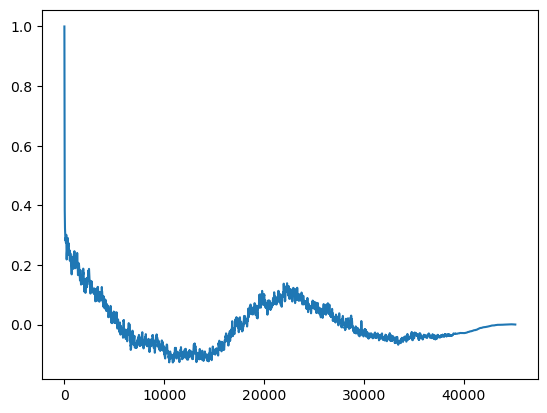

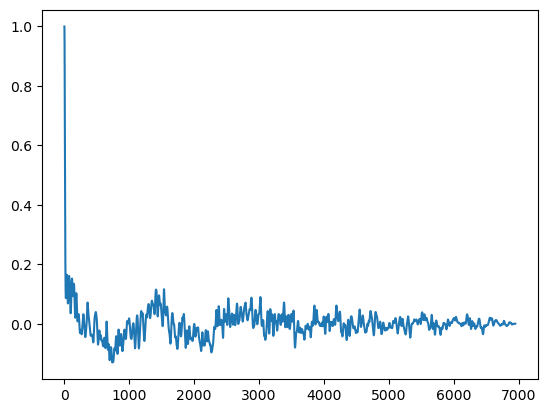

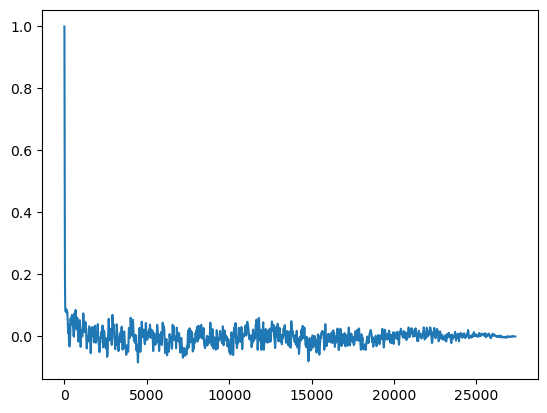

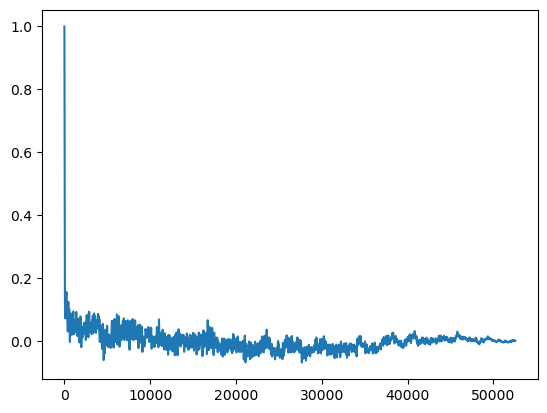

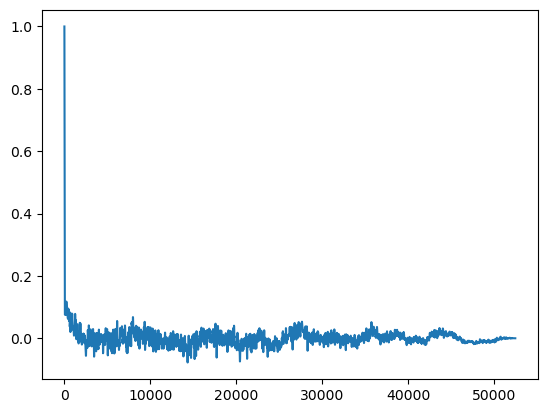

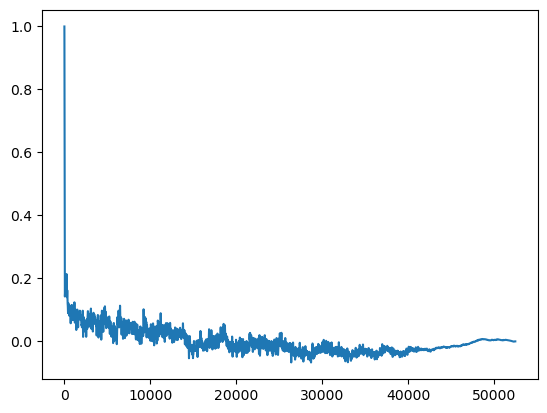

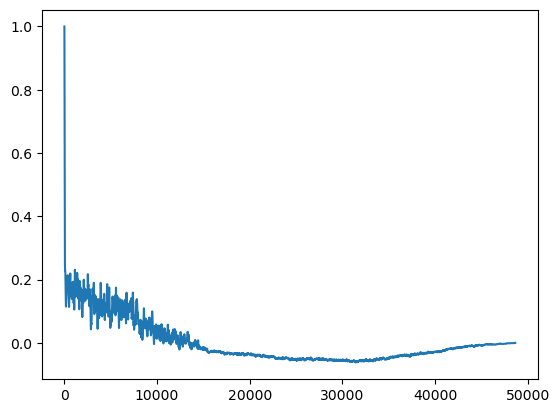

In [147]:
for i in dfs:
    datav = i['V']
    lags = range(len(i))
    acorrv = sm.tsa.acf(datav, nlags = len(lags)-1, fft=False)
    acorrv
    plt.plot(acorrv)
    plt.show()

In [150]:
import random
randomlist = []
for i in range(0,1000):
    n = random.randint(1,30)
    randomlist.append(n)
print(randomlist)

[11, 15, 11, 19, 22, 15, 19, 29, 1, 5, 23, 28, 2, 5, 3, 26, 23, 25, 19, 23, 6, 5, 23, 23, 6, 10, 5, 1, 14, 10, 17, 22, 5, 10, 16, 22, 2, 24, 13, 25, 25, 25, 11, 19, 14, 2, 24, 1, 19, 24, 27, 11, 2, 3, 28, 8, 7, 2, 1, 6, 12, 9, 2, 6, 16, 16, 29, 13, 20, 11, 14, 6, 11, 19, 29, 27, 26, 19, 2, 14, 24, 15, 18, 9, 16, 19, 12, 8, 19, 9, 28, 27, 2, 10, 21, 13, 13, 26, 20, 14, 9, 2, 5, 6, 2, 28, 9, 15, 29, 19, 10, 30, 17, 27, 14, 23, 15, 20, 11, 15, 17, 28, 25, 13, 4, 12, 2, 2, 24, 11, 21, 19, 8, 17, 12, 27, 2, 21, 29, 24, 2, 19, 2, 22, 18, 16, 14, 1, 20, 25, 3, 18, 27, 21, 11, 6, 4, 25, 12, 3, 14, 24, 18, 12, 28, 11, 3, 20, 16, 10, 25, 22, 29, 19, 25, 22, 18, 8, 4, 18, 19, 25, 15, 7, 19, 22, 16, 22, 6, 26, 29, 9, 23, 18, 22, 5, 29, 7, 24, 9, 14, 4, 2, 3, 14, 19, 23, 14, 13, 26, 21, 27, 3, 28, 6, 6, 16, 18, 22, 20, 29, 19, 22, 11, 7, 27, 17, 22, 29, 26, 6, 2, 17, 29, 26, 2, 15, 11, 13, 14, 28, 21, 23, 17, 27, 29, 1, 21, 15, 30, 28, 25, 23, 27, 28, 10, 16, 19, 26, 16, 24, 19, 13, 14, 19, 3, 14, 

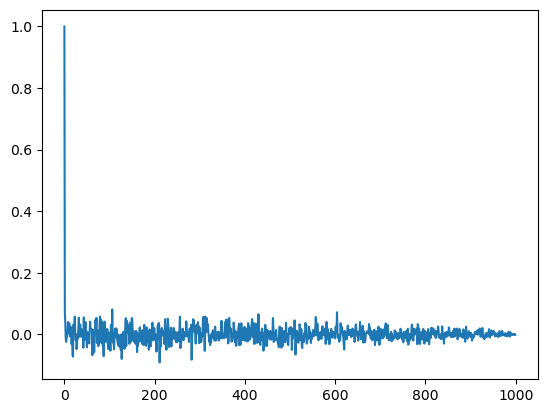

In [151]:
if True:
    acorrv = sm.tsa.acf(randomlist, nlags = len(lags)-1, fft=False)
    acorrv
    plt.plot(acorrv)
    plt.show()

#### Проверяем данные tr92 на адекватность

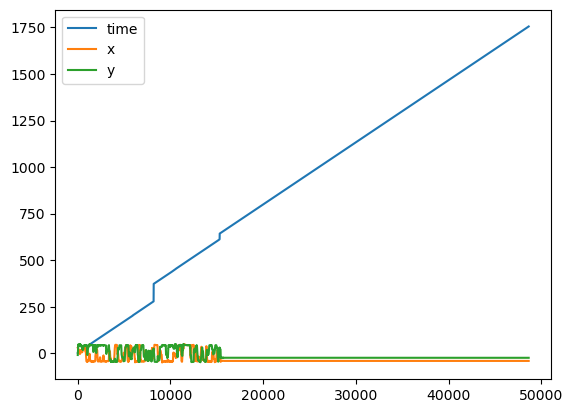

In [38]:
tr92.plot()
plt.show()
#то есть по идее мышь засела в одном месте и мне кажется стоит исключить это из анализа

#### Строим карты оккупации со шкалой от 0 до 1

occ4 = occupMapNorm(tr4)
type(occ4)

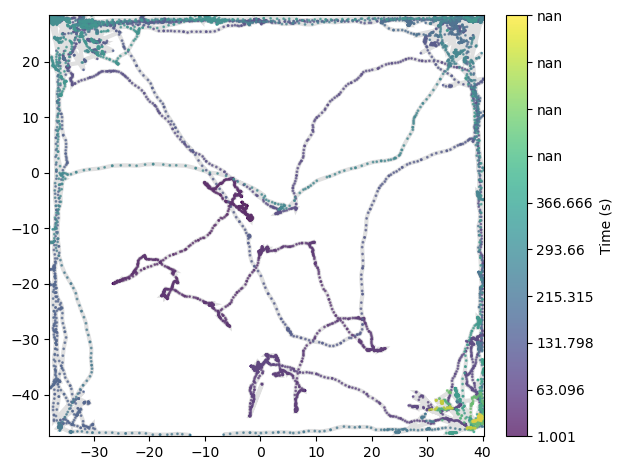

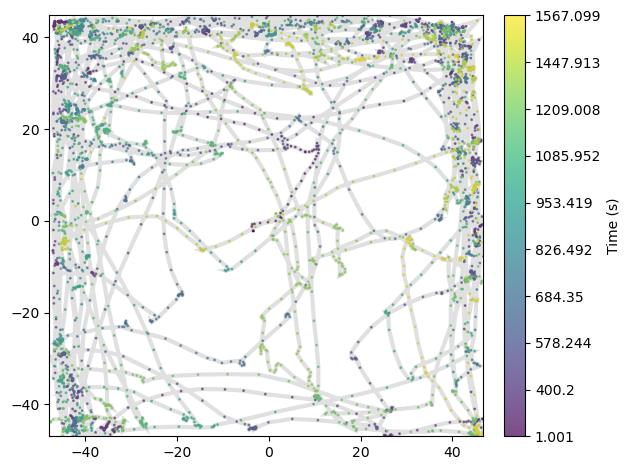

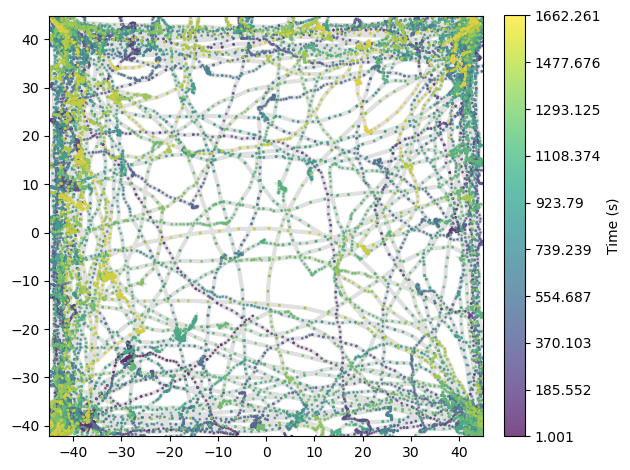

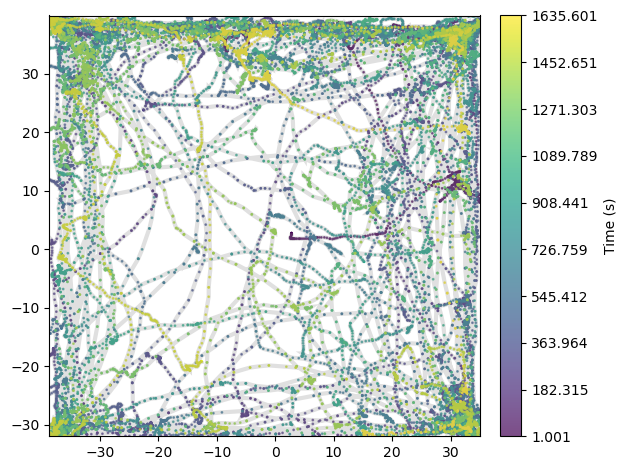

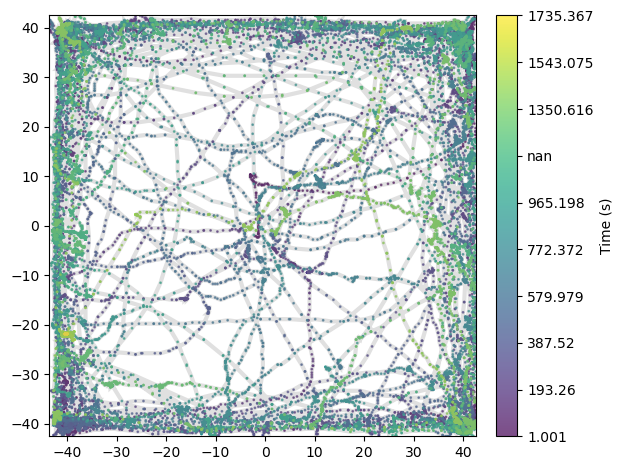

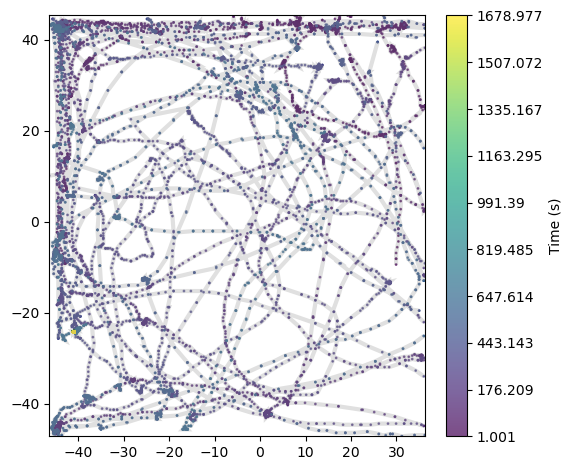

In [40]:
tr4 = cutjump(tr4, xmax=40.4, xmin=-38.1, ymax=28.3, ymin=-47.6)
tr3 = cutjump(tr3, xmax=46.8, xmin=-48, ymax=46, ymin=-47)
tr6 = cutjump(tr6, xmax=45, xmin=-45, ymax=45, ymin=-42.2)
tr7 = cutjump(tr7, xmax=35, xmin=-38.7, ymax=40, ymin=-32)
tr91 = cutjump(tr91, xmax=42.5, xmin=-43.7, ymax=42.5, ymin=-42.7)
tr92 = cutjump(tr92, xmax=36.3, xmin=-46.5, ymax=45.4, ymin=-47.3)

False False


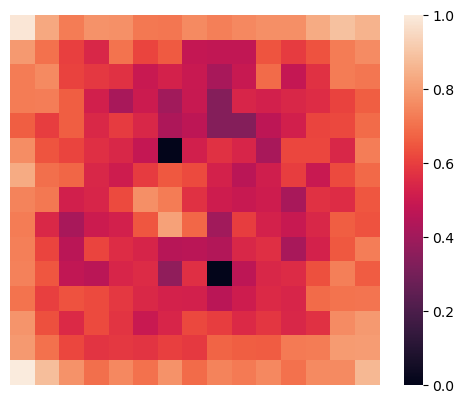

True True


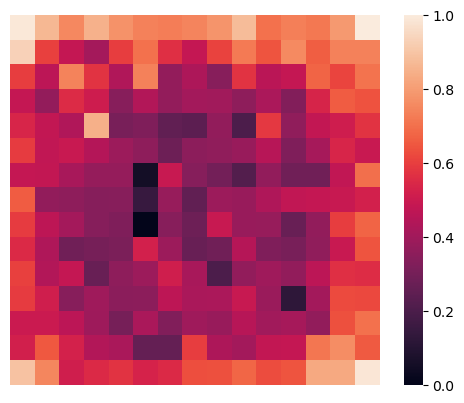

True True


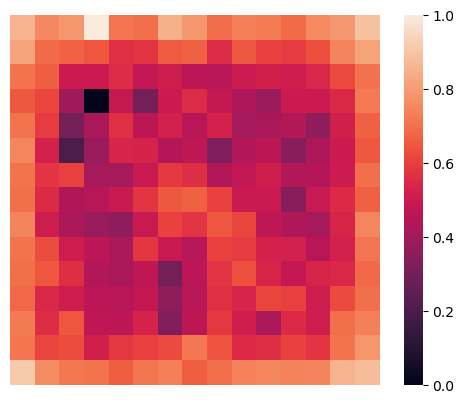

True True


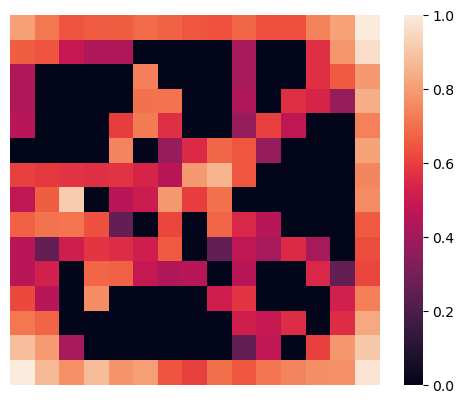

True True


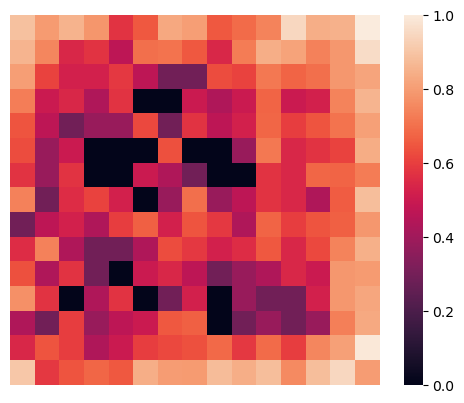

True True


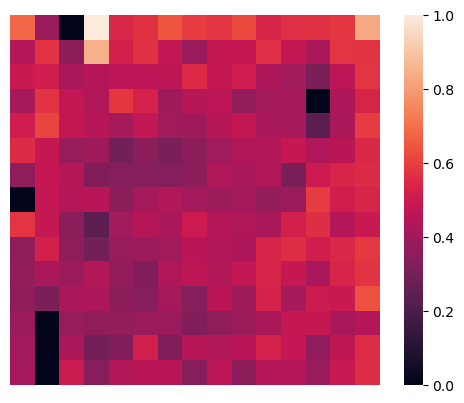

True True


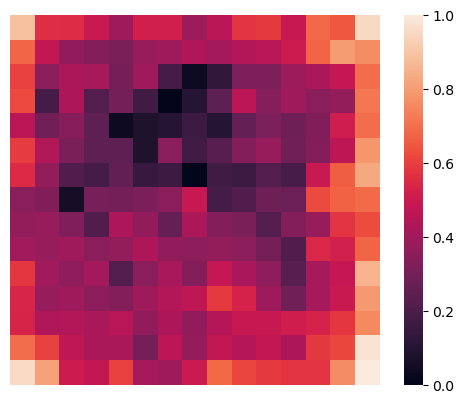

In [54]:
occ5 = occupMapNorm(tr5)
occ6 = occupMapNorm(tr6)
occ91 = occupMapNorm(tr91)
occ4 = occupMapNorm(tr4)
occ3 = occupMapNorm(tr3)
occ92 = occupMapNorm(tr92)
occ7 = occupMapNorm(tr7)

## Average occupancy scores

<AxesSubplot:>

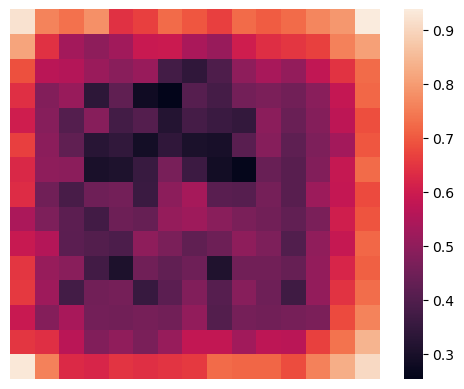

In [47]:
occMean = np.mean( np.array([ occ3, occ5, occ6, occ7, occ91]), axis=0 )
sns.heatmap(occMean, square=True, xticklabels=False, yticklabels=False)
#блин тут другая ось справа... мб стоит нормализовать. и это странно, среднее значение числел до 1 не мб больше 1

### Divergency all mice

In [53]:
def divMap(df, n):
    ind = range(0, len(df))
    df = df.reindex(ind)
    vx = []
    vy = []
    div = []
    for i in range(len(df)):
        if i == 0:
            vx.append(0)
            vy.append(0)
            div.append(0)
        elif (df['x'][i]-df['x'][i-1])==0 or (df['y'][i]-df['y'][i-1])==0:
            vx.append((df['x'][i]-df['x'][i-1])/(df['time'][i]-df['time'][i-1]))
            vy.append((df['y'][i]-df['y'][i-1])/(df['time'][i]-df['time'][i-1]))
            div.append(0)
        else:
            dx = df['x'][i]-df['x'][i-1]
            dy = df['y'][i]-df['y'][i-1]
            dt = df['time'][i]-df['time'][i-1]
            vvx = dx/dt
            vvy = dy/dt
            vx.append(vvx)
            vy.append(vvy)
            div.append(vvx/dx + vvy/dy)
    
    df.insert(3, "Vx", vx)
    df.insert(4, "Vy", vy)
    df.insert(5, "divergence", div)
    binx = np.linspace(df["x"].min(), df["x"].max(), n+1)
    x_cut = pd.cut(df.x, binx, right=False)
    biny = np.linspace(df["y"].min(), df["y"].max(), n+1)
    y_cut = pd.cut(df.y, biny, right=False)
    dfn = df.groupby([x_cut, y_cut]).mean()
    dfn = pd.DataFrame(dfn.loc[:, 'divergence'])
    dfn = dfn.unstack()
    #заменим nan на 0
    dfn = dfn.fillna(0)
    #зашьем в керл минмакс
    dfn = minmax(dfn)
    #sns.heatmap(dfn, robust=False, square=True, xticklabels=False, yticklabels=False)
    return dfn

In [68]:
%matplotlib inline

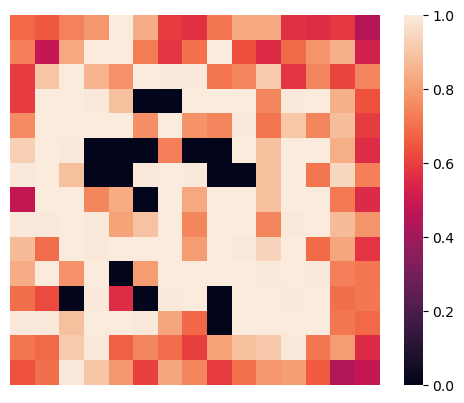

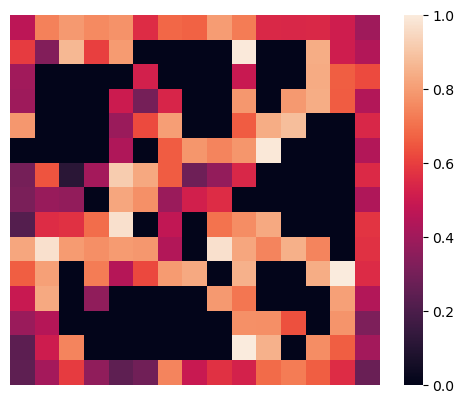

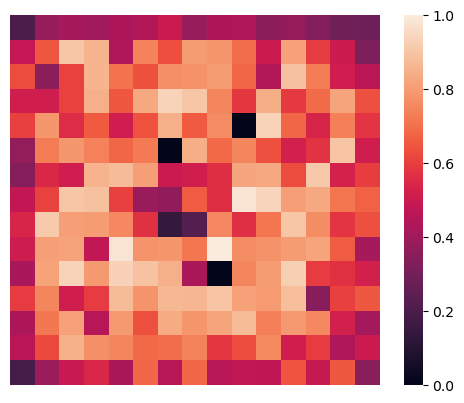

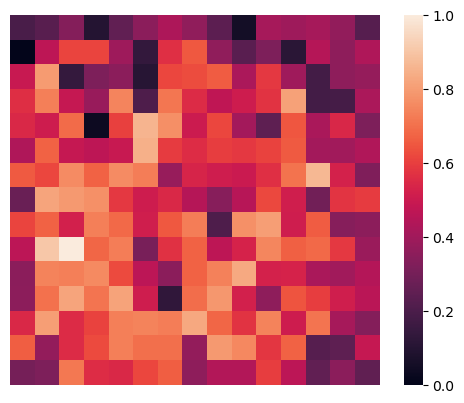

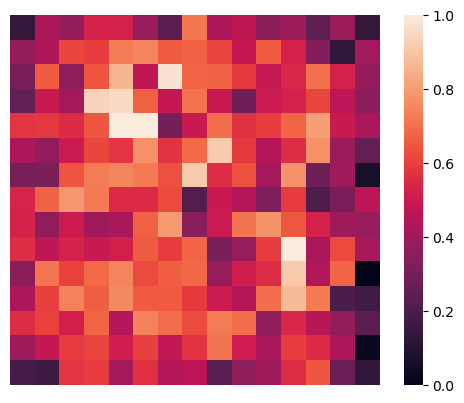

NameError: name 'tr9' is not defined

In [56]:
div3 = divMap(tr3, 15)
div4 = divMap(tr4, 15)
div5 = divMap(tr5, 15)
div6 = divMap(tr6, 15)
div7 = divMap(tr7, 15)
div9 = divMap(tr9, 15)

<AxesSubplot:>

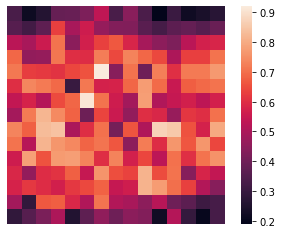

In [79]:
divMean = np.mean( np.array([ div3, div4, div5, div6, div7, div9]), axis=0 )
sns.heatmap(divMean, square=True, xticklabels=False, yticklabels=False)